# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [3]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

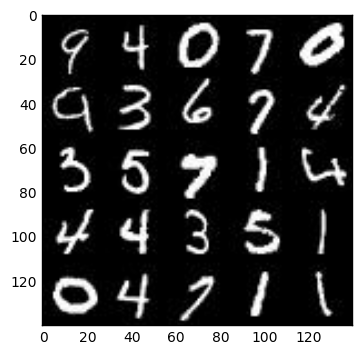

In [4]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

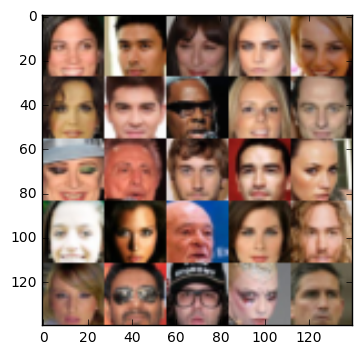

In [5]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [6]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.0.1
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [7]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    input_images = tf.placeholder(tf.float32,[None, image_width, image_height, image_channels],name='input_images')
    input_z = tf.placeholder(tf.float32,[None,z_dim],name = 'input_z')
    learning_rate = tf.placeholder(tf.float32,name = "learing_rate")
    return input_images, input_z, learning_rate


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variabes in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [8]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param image: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function
    alpha = 0.2
    with tf.variable_scope('discriminator', reuse=reuse):
        C1 = tf.layers.conv2d(images,64,3,strides=2, padding='same')
        M1 = tf.maximum(alpha*C1,C1)
        
        C2 = tf.layers.conv2d(M1,128,3,strides=2,padding='same')
        B2 = tf.layers.batch_normalization(C2, training=True)
        M2 = tf.maximum(alpha*B2,B2)
        
        C3 = tf.layers.conv2d(M2,256,3,strides=2,padding='same')
        B3 = tf.layers.batch_normalization(C3, training=True)
        M3 = tf.maximum(alpha*B3,B3)
#         print(M3.shape)
        flat = tf.reshape(M3, (-1, 4*4*256))
        
        logits = tf.layers.dense(flat,1)
        out = tf.sigmoid(logits)
    return out, logits



"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variabes in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [9]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function 
#     print(z)
    with tf.variable_scope('generator',reuse=(not is_train)):
        alpha = 0.2
        x1 = tf.layers.dense(z,7*7*256)
        x1 = tf.reshape(x1, (-1,7,7,256))
        x1 = tf.layers.batch_normalization(x1,training=is_train)

        C1 = tf.layers.conv2d_transpose(x1,128,3,strides=2,padding='same')
        B1 = tf.layers.batch_normalization(C1,training=is_train)
        M1 = tf.maximum(alpha*B1,B1)

        C2 = tf.layers.conv2d_transpose(M1,64,3,strides=2,padding='same')
        B2 = tf.layers.batch_normalization(C2,training=is_train)
        M2 = tf.maximum(alpha*B2,B2)
        
        logits = tf.layers.conv2d_transpose(M2,out_channel_dim,3,strides=1,padding='same')
        output = tf.tanh(logits)
    return output


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [10]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    
    al = 0.1
    g_out = generator(input_z, out_channel_dim, is_train=True)
    d_out_real,d_logits_real = discriminator(input_real, reuse=False)
    dg_out,dg_logits = discriminator(g_out, reuse=True)
    
    dg_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=dg_logits,labels=tf.ones_like(dg_out)))
    
    dr_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real,labels=tf.ones_like(d_out_real)*(1-al)))
    d_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=dg_logits,labels=tf.zeros_like(dg_out)))
    d_loss = dr_loss+d_loss
    return d_loss, dg_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [11]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    t_var = tf.trainable_variables()
    dgr = [var for var in t_var if var.name.startswith('discriminator')]
    gen = [var for var in t_var if var.name.startswith('generator')]
    
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_opt_train = tf.train.AdamOptimizer(beta1=beta1,learning_rate=learning_rate).minimize(d_loss,var_list=dgr)
        g_opt_train = tf.train.AdamOptimizer(beta1=beta1,learning_rate=learning_rate).minimize(g_loss,var_list=gen)
    return d_opt_train, g_opt_train


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [12]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [13]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
    input_images, input_z, learning_rate1 = model_inputs(data_shape[1],data_shape[2],data_shape[3],z_dim)
    
    d_loss, dg_loss = model_loss(input_images, input_z, data_shape[3])
    
    d_opt_train, dg_opt_train = model_opt(d_loss, dg_loss, learning_rate, beta1)
    

    print_times = 20
    show_times = 200

    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        step = 0
        
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):

            
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                feed = {input_images: batch_images, input_z: batch_z, learning_rate1: learning_rate}
                
                sess.run(d_opt_train, feed_dict=feed)  
                sess.run(dg_opt_train, feed_dict=feed)
                
                if step%print_times==0:
                    train_loss_d = d_loss.eval({input_z: batch_z, input_images: batch_images*2})
                    train_loss_g = dg_loss.eval({input_z: batch_z})
                    print("step {}, (epoch {}/{})...".format(step, epoch_i+1, epoch_count),
                          "discriminator loss: {:.3f}...".format(train_loss_d),
                          "generator loss: {:.3f}".format(train_loss_g))
                
                    
                if step%show_times==0:
                    show_generator_output(sess, 64, input_z, data_shape[3], data_image_mode)
                step += 1

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

batch_size = 32
z_dim = 100
learning_rate = 0.0003
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

step 0, (epoch 1/2)... discriminator loss: 7.549... generator loss: 0.002


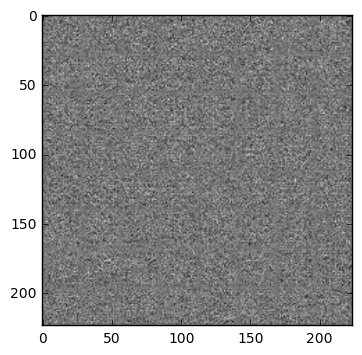

step 20, (epoch 1/2)... discriminator loss: 2.148... generator loss: 0.756
step 40, (epoch 1/2)... discriminator loss: 1.695... generator loss: 0.571
step 60, (epoch 1/2)... discriminator loss: 2.875... generator loss: 2.142
step 80, (epoch 1/2)... discriminator loss: 4.281... generator loss: 2.088
step 100, (epoch 1/2)... discriminator loss: 4.386... generator loss: 2.203
step 120, (epoch 1/2)... discriminator loss: 6.943... generator loss: 3.432
step 140, (epoch 1/2)... discriminator loss: 5.816... generator loss: 5.715
step 160, (epoch 1/2)... discriminator loss: 8.377... generator loss: 5.912
step 180, (epoch 1/2)... discriminator loss: 5.130... generator loss: 2.522
step 200, (epoch 1/2)... discriminator loss: 2.410... generator loss: 0.997


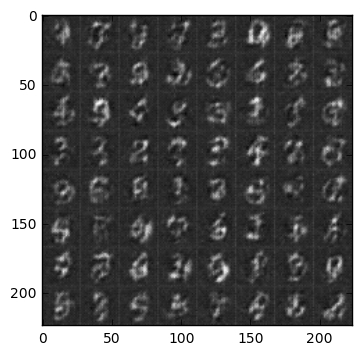

step 220, (epoch 1/2)... discriminator loss: 3.380... generator loss: 1.609
step 240, (epoch 1/2)... discriminator loss: 2.852... generator loss: 0.275
step 260, (epoch 1/2)... discriminator loss: 6.193... generator loss: 4.104
step 280, (epoch 1/2)... discriminator loss: 6.710... generator loss: 5.615
step 300, (epoch 1/2)... discriminator loss: 1.754... generator loss: 1.486
step 320, (epoch 1/2)... discriminator loss: 1.842... generator loss: 1.735
step 340, (epoch 1/2)... discriminator loss: 1.773... generator loss: 1.582
step 360, (epoch 1/2)... discriminator loss: 1.857... generator loss: 2.327
step 380, (epoch 1/2)... discriminator loss: 2.067... generator loss: 1.953
step 400, (epoch 1/2)... discriminator loss: 2.380... generator loss: 2.386


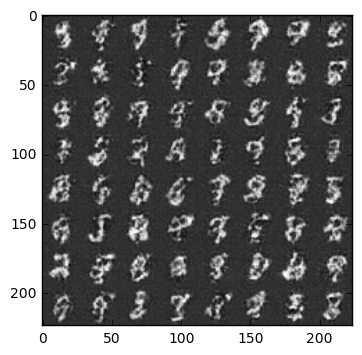

step 420, (epoch 1/2)... discriminator loss: 3.108... generator loss: 3.829
step 440, (epoch 1/2)... discriminator loss: 1.249... generator loss: 2.263
step 460, (epoch 1/2)... discriminator loss: 2.225... generator loss: 0.651
step 480, (epoch 1/2)... discriminator loss: 1.793... generator loss: 1.765
step 500, (epoch 1/2)... discriminator loss: 2.300... generator loss: 2.382
step 520, (epoch 1/2)... discriminator loss: 2.187... generator loss: 1.889
step 540, (epoch 1/2)... discriminator loss: 2.892... generator loss: 3.251
step 560, (epoch 1/2)... discriminator loss: 3.358... generator loss: 3.373
step 580, (epoch 1/2)... discriminator loss: 4.116... generator loss: 3.151
step 600, (epoch 1/2)... discriminator loss: 8.045... generator loss: 9.026


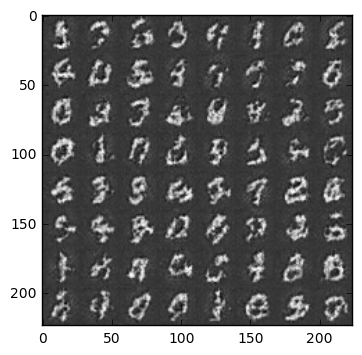

step 620, (epoch 1/2)... discriminator loss: 1.551... generator loss: 0.880
step 640, (epoch 1/2)... discriminator loss: 1.662... generator loss: 1.349
step 660, (epoch 1/2)... discriminator loss: 2.526... generator loss: 2.053
step 680, (epoch 1/2)... discriminator loss: 2.130... generator loss: 2.107
step 700, (epoch 1/2)... discriminator loss: 3.915... generator loss: 2.074
step 720, (epoch 1/2)... discriminator loss: 2.372... generator loss: 1.706
step 740, (epoch 1/2)... discriminator loss: 1.828... generator loss: 1.466
step 760, (epoch 1/2)... discriminator loss: 1.586... generator loss: 2.614
step 780, (epoch 1/2)... discriminator loss: 2.832... generator loss: 3.167
step 800, (epoch 1/2)... discriminator loss: 3.394... generator loss: 3.116


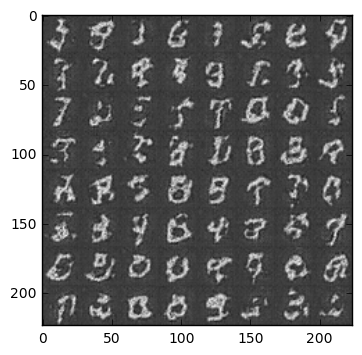

step 820, (epoch 1/2)... discriminator loss: 2.172... generator loss: 0.601
step 840, (epoch 1/2)... discriminator loss: 2.704... generator loss: 1.191
step 860, (epoch 1/2)... discriminator loss: 2.845... generator loss: 0.927
step 880, (epoch 1/2)... discriminator loss: 3.151... generator loss: 1.519
step 900, (epoch 1/2)... discriminator loss: 3.807... generator loss: 2.937
step 920, (epoch 1/2)... discriminator loss: 4.385... generator loss: 3.371
step 940, (epoch 1/2)... discriminator loss: 4.691... generator loss: 4.457
step 960, (epoch 1/2)... discriminator loss: 4.245... generator loss: 0.037
step 980, (epoch 1/2)... discriminator loss: 2.445... generator loss: 1.797
step 1000, (epoch 1/2)... discriminator loss: 2.150... generator loss: 1.270


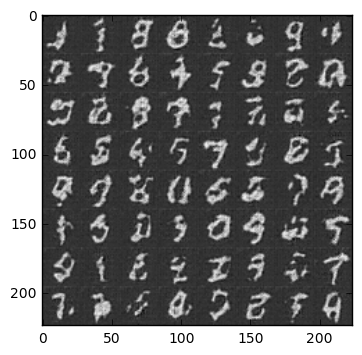

step 1020, (epoch 1/2)... discriminator loss: 1.697... generator loss: 1.509
step 1040, (epoch 1/2)... discriminator loss: 3.456... generator loss: 2.162
step 1060, (epoch 1/2)... discriminator loss: 2.644... generator loss: 2.379
step 1080, (epoch 1/2)... discriminator loss: 4.352... generator loss: 6.465
step 1100, (epoch 1/2)... discriminator loss: 4.905... generator loss: 6.129
step 1120, (epoch 1/2)... discriminator loss: 2.203... generator loss: 1.133
step 1140, (epoch 1/2)... discriminator loss: 3.275... generator loss: 4.883
step 1160, (epoch 1/2)... discriminator loss: 3.121... generator loss: 4.876
step 1180, (epoch 1/2)... discriminator loss: 3.342... generator loss: 3.886
step 1200, (epoch 1/2)... discriminator loss: 3.132... generator loss: 1.331


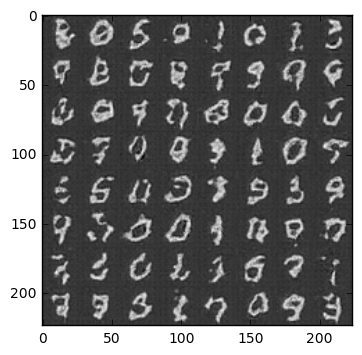

step 1220, (epoch 1/2)... discriminator loss: 2.303... generator loss: 1.305
step 1240, (epoch 1/2)... discriminator loss: 3.348... generator loss: 3.446
step 1260, (epoch 1/2)... discriminator loss: 3.854... generator loss: 4.343
step 1280, (epoch 1/2)... discriminator loss: 2.810... generator loss: 3.413
step 1300, (epoch 1/2)... discriminator loss: 3.525... generator loss: 6.141
step 1320, (epoch 1/2)... discriminator loss: 2.574... generator loss: 5.680
step 1340, (epoch 1/2)... discriminator loss: 1.832... generator loss: 1.513
step 1360, (epoch 1/2)... discriminator loss: 2.035... generator loss: 2.257
step 1380, (epoch 1/2)... discriminator loss: 2.161... generator loss: 1.176
step 1400, (epoch 1/2)... discriminator loss: 2.666... generator loss: 1.993


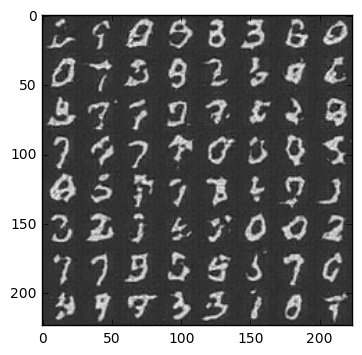

step 1420, (epoch 1/2)... discriminator loss: 2.616... generator loss: 2.535
step 1440, (epoch 1/2)... discriminator loss: 2.629... generator loss: 1.363
step 1460, (epoch 1/2)... discriminator loss: 3.828... generator loss: 5.083
step 1480, (epoch 1/2)... discriminator loss: 3.405... generator loss: 4.434
step 1500, (epoch 1/2)... discriminator loss: 3.061... generator loss: 2.246
step 1520, (epoch 1/2)... discriminator loss: 1.959... generator loss: 1.293
step 1540, (epoch 1/2)... discriminator loss: 2.302... generator loss: 2.719
step 1560, (epoch 1/2)... discriminator loss: 2.636... generator loss: 1.817
step 1580, (epoch 1/2)... discriminator loss: 3.758... generator loss: 4.534
step 1600, (epoch 1/2)... discriminator loss: 3.534... generator loss: 4.570


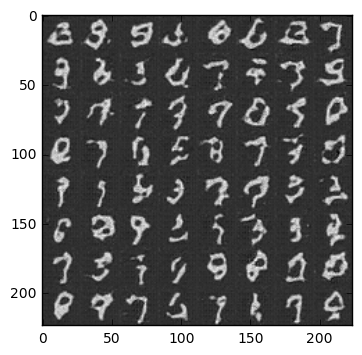

step 1620, (epoch 1/2)... discriminator loss: 3.744... generator loss: 3.339
step 1640, (epoch 1/2)... discriminator loss: 3.907... generator loss: 3.895
step 1660, (epoch 1/2)... discriminator loss: 3.703... generator loss: 2.801
step 1680, (epoch 1/2)... discriminator loss: 4.489... generator loss: 4.337
step 1700, (epoch 1/2)... discriminator loss: 3.720... generator loss: 2.206
step 1720, (epoch 1/2)... discriminator loss: 3.416... generator loss: 3.007
step 1740, (epoch 1/2)... discriminator loss: 1.716... generator loss: 0.910
step 1760, (epoch 1/2)... discriminator loss: 1.071... generator loss: 1.223
step 1780, (epoch 1/2)... discriminator loss: 0.725... generator loss: 1.486
step 1800, (epoch 1/2)... discriminator loss: 1.130... generator loss: 2.914


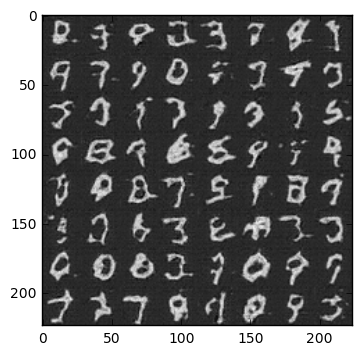

step 1820, (epoch 2/2)... discriminator loss: 1.528... generator loss: 2.634
step 1840, (epoch 2/2)... discriminator loss: 1.268... generator loss: 1.882
step 1860, (epoch 2/2)... discriminator loss: 1.419... generator loss: 2.370
step 1880, (epoch 2/2)... discriminator loss: 2.182... generator loss: 2.396
step 1900, (epoch 2/2)... discriminator loss: 2.223... generator loss: 2.751
step 1920, (epoch 2/2)... discriminator loss: 2.360... generator loss: 2.998
step 1940, (epoch 2/2)... discriminator loss: 2.719... generator loss: 2.784
step 1960, (epoch 2/2)... discriminator loss: 3.016... generator loss: 4.117
step 1980, (epoch 2/2)... discriminator loss: 2.213... generator loss: 2.067
step 2000, (epoch 2/2)... discriminator loss: 3.056... generator loss: 6.329


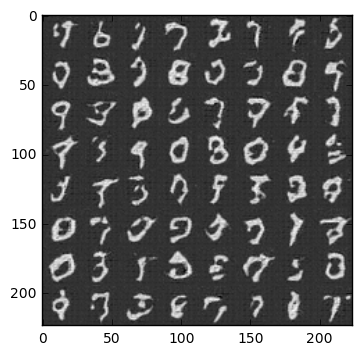

step 2020, (epoch 2/2)... discriminator loss: 1.903... generator loss: 1.663
step 2040, (epoch 2/2)... discriminator loss: 1.584... generator loss: 3.230
step 2060, (epoch 2/2)... discriminator loss: 0.932... generator loss: 1.521
step 2080, (epoch 2/2)... discriminator loss: 1.560... generator loss: 2.308
step 2100, (epoch 2/2)... discriminator loss: 1.336... generator loss: 2.123
step 2120, (epoch 2/2)... discriminator loss: 2.171... generator loss: 2.106
step 2140, (epoch 2/2)... discriminator loss: 1.553... generator loss: 2.249
step 2160, (epoch 2/2)... discriminator loss: 2.622... generator loss: 3.768
step 2180, (epoch 2/2)... discriminator loss: 2.460... generator loss: 3.227
step 2200, (epoch 2/2)... discriminator loss: 4.408... generator loss: 4.493


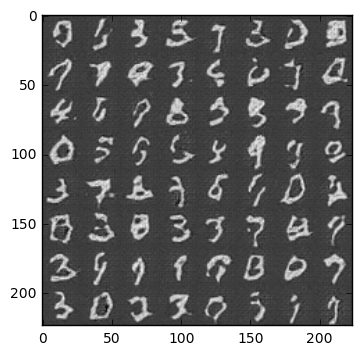

step 2220, (epoch 2/2)... discriminator loss: 1.990... generator loss: 1.631
step 2240, (epoch 2/2)... discriminator loss: 2.400... generator loss: 3.444
step 2260, (epoch 2/2)... discriminator loss: 2.595... generator loss: 3.944
step 2280, (epoch 2/2)... discriminator loss: 2.452... generator loss: 3.438
step 2300, (epoch 2/2)... discriminator loss: 2.950... generator loss: 3.637
step 2320, (epoch 2/2)... discriminator loss: 1.662... generator loss: 1.675
step 2340, (epoch 2/2)... discriminator loss: 2.727... generator loss: 3.962
step 2360, (epoch 2/2)... discriminator loss: 3.496... generator loss: 2.909
step 2380, (epoch 2/2)... discriminator loss: 4.057... generator loss: 3.489
step 2400, (epoch 2/2)... discriminator loss: 2.625... generator loss: 3.785


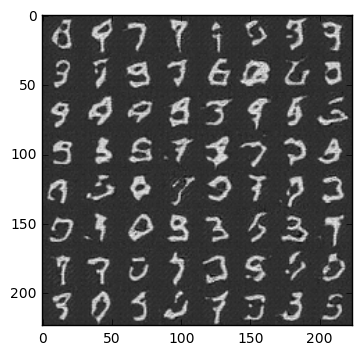

step 2420, (epoch 2/2)... discriminator loss: 2.934... generator loss: 2.211
step 2440, (epoch 2/2)... discriminator loss: 4.746... generator loss: 4.988
step 2460, (epoch 2/2)... discriminator loss: 1.458... generator loss: 2.302
step 2480, (epoch 2/2)... discriminator loss: 1.381... generator loss: 3.097
step 2500, (epoch 2/2)... discriminator loss: 1.224... generator loss: 3.496
step 2520, (epoch 2/2)... discriminator loss: 2.097... generator loss: 2.153
step 2540, (epoch 2/2)... discriminator loss: 2.989... generator loss: 3.535
step 2560, (epoch 2/2)... discriminator loss: 3.156... generator loss: 2.511
step 2580, (epoch 2/2)... discriminator loss: 3.522... generator loss: 3.313
step 2600, (epoch 2/2)... discriminator loss: 3.387... generator loss: 3.542


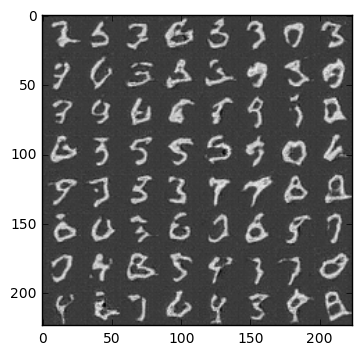

step 2620, (epoch 2/2)... discriminator loss: 2.599... generator loss: 1.814
step 2640, (epoch 2/2)... discriminator loss: 2.384... generator loss: 2.824
step 2660, (epoch 2/2)... discriminator loss: 3.699... generator loss: 3.103
step 2680, (epoch 2/2)... discriminator loss: 3.780... generator loss: 4.006
step 2700, (epoch 2/2)... discriminator loss: 1.108... generator loss: 4.329
step 2720, (epoch 2/2)... discriminator loss: 1.114... generator loss: 2.770
step 2740, (epoch 2/2)... discriminator loss: 1.359... generator loss: 1.852
step 2760, (epoch 2/2)... discriminator loss: 2.050... generator loss: 3.414
step 2780, (epoch 2/2)... discriminator loss: 2.135... generator loss: 2.404
step 2800, (epoch 2/2)... discriminator loss: 2.677... generator loss: 2.304


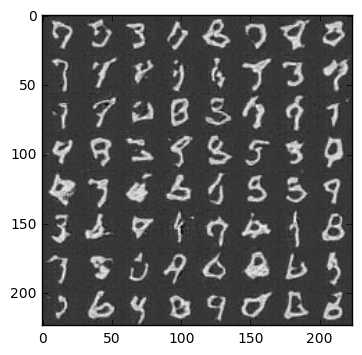

step 2820, (epoch 2/2)... discriminator loss: 2.866... generator loss: 2.861
step 2840, (epoch 2/2)... discriminator loss: 2.811... generator loss: 2.554
step 2860, (epoch 2/2)... discriminator loss: 3.414... generator loss: 5.333
step 2880, (epoch 2/2)... discriminator loss: 3.251... generator loss: 3.669
step 2900, (epoch 2/2)... discriminator loss: 2.979... generator loss: 3.663
step 2920, (epoch 2/2)... discriminator loss: 3.603... generator loss: 5.933
step 2940, (epoch 2/2)... discriminator loss: 3.501... generator loss: 4.418
step 2960, (epoch 2/2)... discriminator loss: 3.806... generator loss: 4.747
step 2980, (epoch 2/2)... discriminator loss: 3.770... generator loss: 2.908
step 3000, (epoch 2/2)... discriminator loss: 2.438... generator loss: 2.401


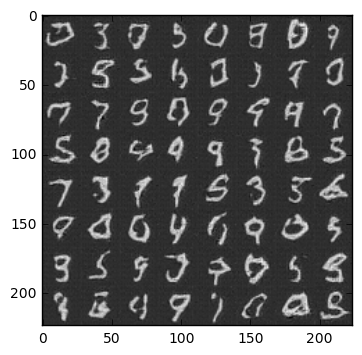

step 3020, (epoch 2/2)... discriminator loss: 2.279... generator loss: 1.944
step 3040, (epoch 2/2)... discriminator loss: 2.605... generator loss: 3.281
step 3060, (epoch 2/2)... discriminator loss: 2.865... generator loss: 2.693
step 3080, (epoch 2/2)... discriminator loss: 2.722... generator loss: 3.409
step 3100, (epoch 2/2)... discriminator loss: 3.106... generator loss: 3.974
step 3120, (epoch 2/2)... discriminator loss: 3.382... generator loss: 3.206
step 3140, (epoch 2/2)... discriminator loss: 1.134... generator loss: 0.764
step 3160, (epoch 2/2)... discriminator loss: 1.802... generator loss: 2.606
step 3180, (epoch 2/2)... discriminator loss: 2.401... generator loss: 3.050
step 3200, (epoch 2/2)... discriminator loss: 2.736... generator loss: 3.999


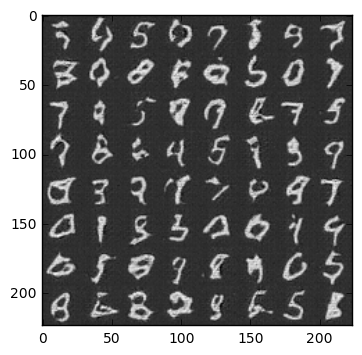

step 3220, (epoch 2/2)... discriminator loss: 2.735... generator loss: 2.289
step 3240, (epoch 2/2)... discriminator loss: 2.707... generator loss: 2.915
step 3260, (epoch 2/2)... discriminator loss: 2.307... generator loss: 2.524
step 3280, (epoch 2/2)... discriminator loss: 3.225... generator loss: 2.769
step 3300, (epoch 2/2)... discriminator loss: 2.930... generator loss: 2.610
step 3320, (epoch 2/2)... discriminator loss: 3.394... generator loss: 2.573
step 3340, (epoch 2/2)... discriminator loss: 3.838... generator loss: 3.911
step 3360, (epoch 2/2)... discriminator loss: 4.250... generator loss: 4.962
step 3380, (epoch 2/2)... discriminator loss: 3.554... generator loss: 3.476
step 3400, (epoch 2/2)... discriminator loss: 3.935... generator loss: 2.873


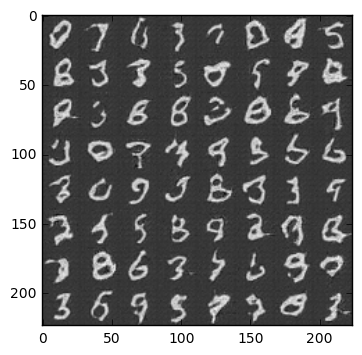

step 3420, (epoch 2/2)... discriminator loss: 2.740... generator loss: 3.883
step 3440, (epoch 2/2)... discriminator loss: 3.279... generator loss: 3.336
step 3460, (epoch 2/2)... discriminator loss: 3.421... generator loss: 3.475
step 3480, (epoch 2/2)... discriminator loss: 3.019... generator loss: 3.143
step 3500, (epoch 2/2)... discriminator loss: 3.555... generator loss: 3.618
step 3520, (epoch 2/2)... discriminator loss: 0.817... generator loss: 2.008
step 3540, (epoch 2/2)... discriminator loss: 0.957... generator loss: 1.127
step 3560, (epoch 2/2)... discriminator loss: 1.009... generator loss: 2.547
step 3580, (epoch 2/2)... discriminator loss: 1.839... generator loss: 1.986
step 3600, (epoch 2/2)... discriminator loss: 2.353... generator loss: 3.238


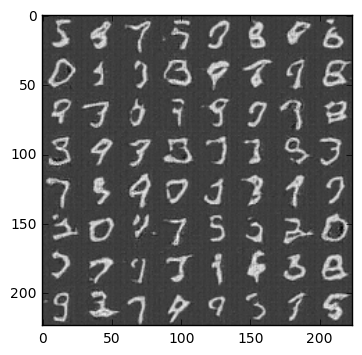

step 3620, (epoch 2/2)... discriminator loss: 2.802... generator loss: 2.715


In [14]:
batch_size = 32
z_dim = 100
learning_rate = 0.0006
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))

with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

step 0, (epoch 1/1)... discriminator loss: 5.878... generator loss: 0.007


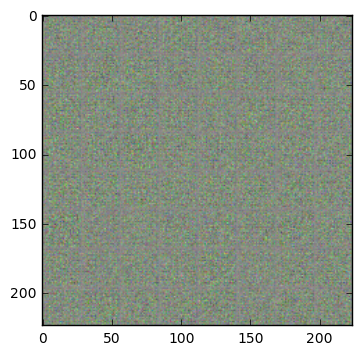

step 20, (epoch 1/1)... discriminator loss: 2.060... generator loss: 0.280
step 40, (epoch 1/1)... discriminator loss: 1.108... generator loss: 0.862
step 60, (epoch 1/1)... discriminator loss: 1.730... generator loss: 0.358
step 80, (epoch 1/1)... discriminator loss: 1.817... generator loss: 1.535
step 100, (epoch 1/1)... discriminator loss: 2.663... generator loss: 1.924
step 120, (epoch 1/1)... discriminator loss: 4.631... generator loss: 3.715
step 140, (epoch 1/1)... discriminator loss: 5.686... generator loss: 0.572
step 160, (epoch 1/1)... discriminator loss: 2.619... generator loss: 2.620
step 180, (epoch 1/1)... discriminator loss: 8.567... generator loss: 6.599
step 200, (epoch 1/1)... discriminator loss: 3.280... generator loss: 1.981


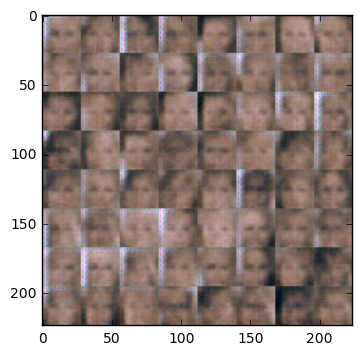

step 220, (epoch 1/1)... discriminator loss: 2.295... generator loss: 2.184
step 240, (epoch 1/1)... discriminator loss: 3.166... generator loss: 3.924
step 260, (epoch 1/1)... discriminator loss: 2.667... generator loss: 4.230
step 280, (epoch 1/1)... discriminator loss: 3.583... generator loss: 2.499
step 300, (epoch 1/1)... discriminator loss: 5.586... generator loss: 4.063
step 320, (epoch 1/1)... discriminator loss: 2.925... generator loss: 0.778
step 340, (epoch 1/1)... discriminator loss: 3.866... generator loss: 3.456
step 360, (epoch 1/1)... discriminator loss: 6.068... generator loss: 3.571
step 380, (epoch 1/1)... discriminator loss: 1.455... generator loss: 0.896
step 400, (epoch 1/1)... discriminator loss: 1.841... generator loss: 0.926


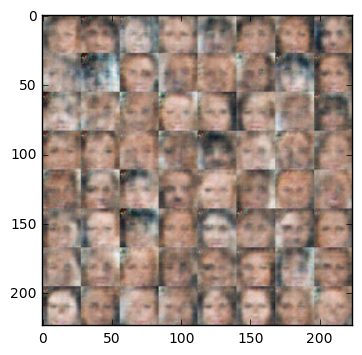

step 420, (epoch 1/1)... discriminator loss: 1.445... generator loss: 1.080
step 440, (epoch 1/1)... discriminator loss: 1.351... generator loss: 1.017
step 460, (epoch 1/1)... discriminator loss: 1.777... generator loss: 2.122
step 480, (epoch 1/1)... discriminator loss: 2.820... generator loss: 4.290
step 500, (epoch 1/1)... discriminator loss: 5.654... generator loss: 3.551
step 520, (epoch 1/1)... discriminator loss: 4.298... generator loss: 1.744
step 540, (epoch 1/1)... discriminator loss: 4.986... generator loss: 7.111
step 560, (epoch 1/1)... discriminator loss: 4.098... generator loss: 5.426
step 580, (epoch 1/1)... discriminator loss: 5.454... generator loss: 2.724
step 600, (epoch 1/1)... discriminator loss: 5.757... generator loss: 4.099


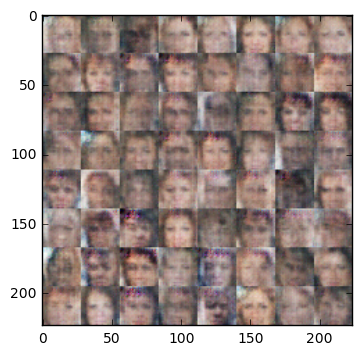

step 620, (epoch 1/1)... discriminator loss: 2.162... generator loss: 5.098
step 640, (epoch 1/1)... discriminator loss: 4.541... generator loss: 3.398
step 660, (epoch 1/1)... discriminator loss: 3.536... generator loss: 1.728
step 680, (epoch 1/1)... discriminator loss: 6.212... generator loss: 6.353
step 700, (epoch 1/1)... discriminator loss: 3.714... generator loss: 6.391
step 720, (epoch 1/1)... discriminator loss: 4.506... generator loss: 7.144
step 740, (epoch 1/1)... discriminator loss: 6.619... generator loss: 1.968
step 760, (epoch 1/1)... discriminator loss: 5.784... generator loss: 8.948
step 780, (epoch 1/1)... discriminator loss: 5.872... generator loss: 3.402
step 800, (epoch 1/1)... discriminator loss: 5.172... generator loss: 4.486


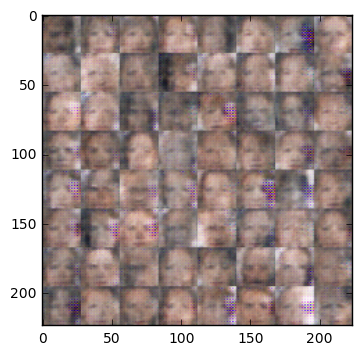

step 820, (epoch 1/1)... discriminator loss: 4.122... generator loss: 5.790
step 840, (epoch 1/1)... discriminator loss: 4.747... generator loss: 3.294
step 860, (epoch 1/1)... discriminator loss: 4.540... generator loss: 4.711
step 880, (epoch 1/1)... discriminator loss: 4.647... generator loss: 6.649
step 900, (epoch 1/1)... discriminator loss: 4.496... generator loss: 5.989
step 920, (epoch 1/1)... discriminator loss: 6.069... generator loss: 7.350
step 940, (epoch 1/1)... discriminator loss: 5.041... generator loss: 7.838
step 960, (epoch 1/1)... discriminator loss: 6.603... generator loss: 3.487
step 980, (epoch 1/1)... discriminator loss: 1.573... generator loss: 6.207
step 1000, (epoch 1/1)... discriminator loss: 4.008... generator loss: 7.580


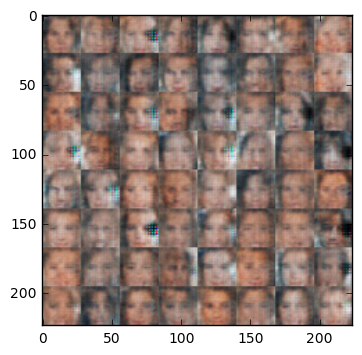

step 1020, (epoch 1/1)... discriminator loss: 5.122... generator loss: 1.798
step 1040, (epoch 1/1)... discriminator loss: 5.768... generator loss: 4.118
step 1060, (epoch 1/1)... discriminator loss: 7.283... generator loss: 8.847
step 1080, (epoch 1/1)... discriminator loss: 7.647... generator loss: 3.906
step 1100, (epoch 1/1)... discriminator loss: 5.897... generator loss: 2.129
step 1120, (epoch 1/1)... discriminator loss: 3.813... generator loss: 2.860
step 1140, (epoch 1/1)... discriminator loss: 5.007... generator loss: 6.764
step 1160, (epoch 1/1)... discriminator loss: 7.539... generator loss: 8.588
step 1180, (epoch 1/1)... discriminator loss: 8.116... generator loss: 7.883
step 1200, (epoch 1/1)... discriminator loss: 4.062... generator loss: 3.910


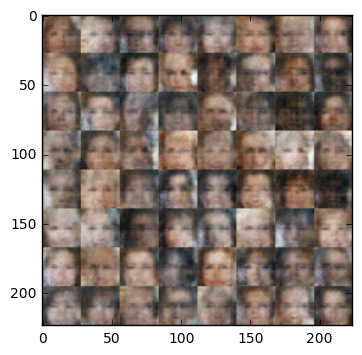

step 1220, (epoch 1/1)... discriminator loss: 5.365... generator loss: 4.291
step 1240, (epoch 1/1)... discriminator loss: 4.795... generator loss: 8.371
step 1260, (epoch 1/1)... discriminator loss: 5.449... generator loss: 8.172
step 1280, (epoch 1/1)... discriminator loss: 5.914... generator loss: 6.481
step 1300, (epoch 1/1)... discriminator loss: 6.662... generator loss: 5.593
step 1320, (epoch 1/1)... discriminator loss: 5.950... generator loss: 1.584
step 1340, (epoch 1/1)... discriminator loss: 5.892... generator loss: 7.793
step 1360, (epoch 1/1)... discriminator loss: 5.784... generator loss: 2.219
step 1380, (epoch 1/1)... discriminator loss: 6.302... generator loss: 8.304
step 1400, (epoch 1/1)... discriminator loss: 4.161... generator loss: 5.751


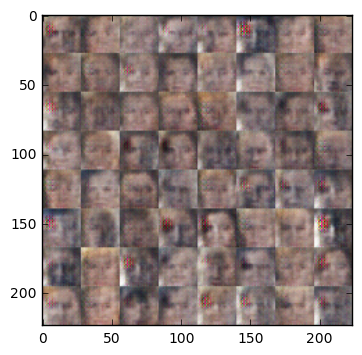

step 1420, (epoch 1/1)... discriminator loss: 4.791... generator loss: 8.477
step 1440, (epoch 1/1)... discriminator loss: 5.334... generator loss: 3.392
step 1460, (epoch 1/1)... discriminator loss: 4.975... generator loss: 7.622
step 1480, (epoch 1/1)... discriminator loss: 4.900... generator loss: 5.571
step 1500, (epoch 1/1)... discriminator loss: 6.441... generator loss: 1.219
step 1520, (epoch 1/1)... discriminator loss: 2.629... generator loss: 7.769
step 1540, (epoch 1/1)... discriminator loss: 4.342... generator loss: 5.862
step 1560, (epoch 1/1)... discriminator loss: 5.383... generator loss: 3.563
step 1580, (epoch 1/1)... discriminator loss: 4.529... generator loss: 7.555
step 1600, (epoch 1/1)... discriminator loss: 6.047... generator loss: 7.302


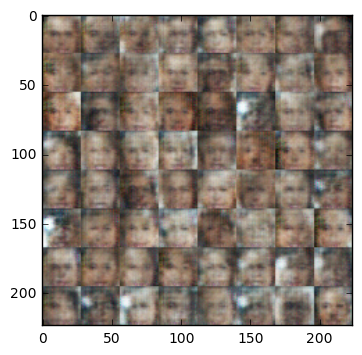

step 1620, (epoch 1/1)... discriminator loss: 2.565... generator loss: 3.924
step 1640, (epoch 1/1)... discriminator loss: 4.008... generator loss: 0.956
step 1660, (epoch 1/1)... discriminator loss: 3.368... generator loss: 2.493
step 1680, (epoch 1/1)... discriminator loss: 3.980... generator loss: 4.801
step 1700, (epoch 1/1)... discriminator loss: 2.857... generator loss: 3.567
step 1720, (epoch 1/1)... discriminator loss: 2.835... generator loss: 0.646
step 1740, (epoch 1/1)... discriminator loss: 2.414... generator loss: 1.009
step 1760, (epoch 1/1)... discriminator loss: 3.347... generator loss: 5.719
step 1780, (epoch 1/1)... discriminator loss: 4.819... generator loss: 5.648
step 1800, (epoch 1/1)... discriminator loss: 3.577... generator loss: 10.043


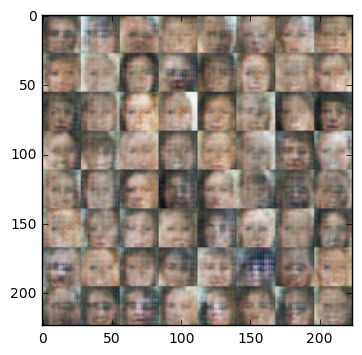

step 1820, (epoch 1/1)... discriminator loss: 2.913... generator loss: 8.039
step 1840, (epoch 1/1)... discriminator loss: 4.662... generator loss: 6.957
step 1860, (epoch 1/1)... discriminator loss: 5.251... generator loss: 7.331
step 1880, (epoch 1/1)... discriminator loss: 5.219... generator loss: 4.006
step 1900, (epoch 1/1)... discriminator loss: 4.954... generator loss: 6.935
step 1920, (epoch 1/1)... discriminator loss: 5.273... generator loss: 6.190
step 1940, (epoch 1/1)... discriminator loss: 5.301... generator loss: 6.891
step 1960, (epoch 1/1)... discriminator loss: 6.071... generator loss: 4.612
step 1980, (epoch 1/1)... discriminator loss: 5.738... generator loss: 7.618
step 2000, (epoch 1/1)... discriminator loss: 5.766... generator loss: 6.052


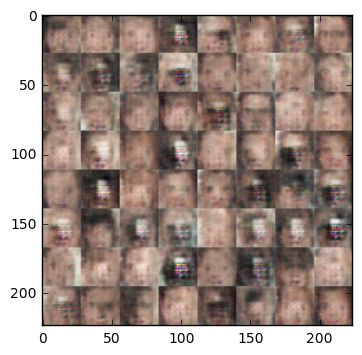

step 2020, (epoch 1/1)... discriminator loss: 5.716... generator loss: 5.662
step 2040, (epoch 1/1)... discriminator loss: 4.829... generator loss: 4.141
step 2060, (epoch 1/1)... discriminator loss: 5.228... generator loss: 5.194
step 2080, (epoch 1/1)... discriminator loss: 5.233... generator loss: 6.467
step 2100, (epoch 1/1)... discriminator loss: 3.463... generator loss: 0.795
step 2120, (epoch 1/1)... discriminator loss: 3.141... generator loss: 2.152
step 2140, (epoch 1/1)... discriminator loss: 4.684... generator loss: 6.302
step 2160, (epoch 1/1)... discriminator loss: 5.957... generator loss: 6.855
step 2180, (epoch 1/1)... discriminator loss: 5.771... generator loss: 6.936
step 2200, (epoch 1/1)... discriminator loss: 6.640... generator loss: 9.417


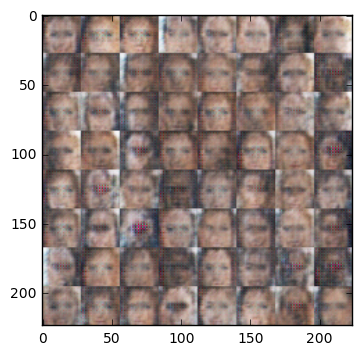

step 2220, (epoch 1/1)... discriminator loss: 5.152... generator loss: 5.564
step 2240, (epoch 1/1)... discriminator loss: 4.700... generator loss: 5.317
step 2260, (epoch 1/1)... discriminator loss: 5.051... generator loss: 2.109
step 2280, (epoch 1/1)... discriminator loss: 5.295... generator loss: 1.309
step 2300, (epoch 1/1)... discriminator loss: 6.848... generator loss: 7.922
step 2320, (epoch 1/1)... discriminator loss: 6.106... generator loss: 1.303
step 2340, (epoch 1/1)... discriminator loss: 4.978... generator loss: 0.691
step 2360, (epoch 1/1)... discriminator loss: 3.464... generator loss: 3.685
step 2380, (epoch 1/1)... discriminator loss: 3.480... generator loss: 3.092
step 2400, (epoch 1/1)... discriminator loss: 3.718... generator loss: 2.633


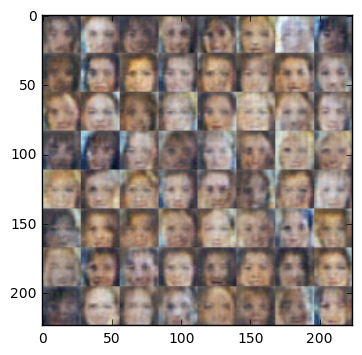

step 2420, (epoch 1/1)... discriminator loss: 4.920... generator loss: 2.662
step 2440, (epoch 1/1)... discriminator loss: 5.964... generator loss: 8.678
step 2460, (epoch 1/1)... discriminator loss: 3.699... generator loss: 0.958
step 2480, (epoch 1/1)... discriminator loss: 3.915... generator loss: 7.434
step 2500, (epoch 1/1)... discriminator loss: 9.091... generator loss: 7.338
step 2520, (epoch 1/1)... discriminator loss: 4.723... generator loss: 1.452
step 2540, (epoch 1/1)... discriminator loss: 5.150... generator loss: 1.748
step 2560, (epoch 1/1)... discriminator loss: 5.606... generator loss: 4.177
step 2580, (epoch 1/1)... discriminator loss: 3.797... generator loss: 1.285
step 2600, (epoch 1/1)... discriminator loss: 3.758... generator loss: 2.320


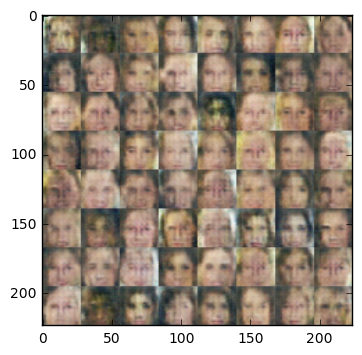

step 2620, (epoch 1/1)... discriminator loss: 2.803... generator loss: 5.118
step 2640, (epoch 1/1)... discriminator loss: 4.995... generator loss: 1.970
step 2660, (epoch 1/1)... discriminator loss: 4.829... generator loss: 2.209
step 2680, (epoch 1/1)... discriminator loss: 4.008... generator loss: 3.821
step 2700, (epoch 1/1)... discriminator loss: 4.997... generator loss: 0.577
step 2720, (epoch 1/1)... discriminator loss: 3.479... generator loss: 3.140
step 2740, (epoch 1/1)... discriminator loss: 5.360... generator loss: 7.871
step 2760, (epoch 1/1)... discriminator loss: 4.443... generator loss: 6.807
step 2780, (epoch 1/1)... discriminator loss: 5.320... generator loss: 4.966
step 2800, (epoch 1/1)... discriminator loss: 6.031... generator loss: 6.387


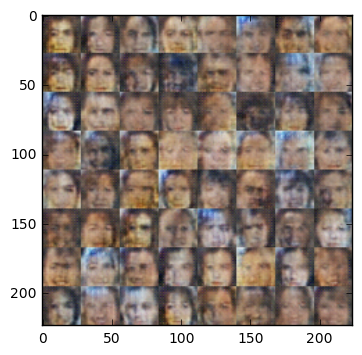

step 2820, (epoch 1/1)... discriminator loss: 10.632... generator loss: 7.796
step 2840, (epoch 1/1)... discriminator loss: 2.743... generator loss: 1.482
step 2860, (epoch 1/1)... discriminator loss: 2.357... generator loss: 1.731
step 2880, (epoch 1/1)... discriminator loss: 3.779... generator loss: 3.891
step 2900, (epoch 1/1)... discriminator loss: 3.700... generator loss: 2.604
step 2920, (epoch 1/1)... discriminator loss: 6.167... generator loss: 3.325
step 2940, (epoch 1/1)... discriminator loss: 3.673... generator loss: 0.637
step 2960, (epoch 1/1)... discriminator loss: 3.424... generator loss: 8.042
step 2980, (epoch 1/1)... discriminator loss: 5.038... generator loss: 2.102
step 3000, (epoch 1/1)... discriminator loss: 4.772... generator loss: 5.254


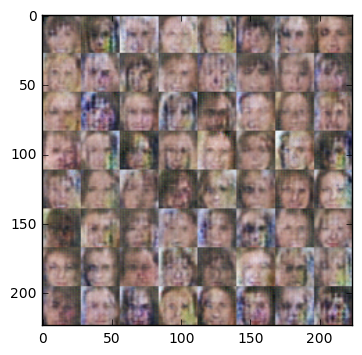

step 3020, (epoch 1/1)... discriminator loss: 6.284... generator loss: 3.771
step 3040, (epoch 1/1)... discriminator loss: 4.873... generator loss: 0.496
step 3060, (epoch 1/1)... discriminator loss: 3.726... generator loss: 5.082
step 3080, (epoch 1/1)... discriminator loss: 4.548... generator loss: 1.422
step 3100, (epoch 1/1)... discriminator loss: 1.995... generator loss: 2.329
step 3120, (epoch 1/1)... discriminator loss: 3.312... generator loss: 3.054
step 3140, (epoch 1/1)... discriminator loss: 4.103... generator loss: 1.463
step 3160, (epoch 1/1)... discriminator loss: 5.807... generator loss: 5.015
step 3180, (epoch 1/1)... discriminator loss: 7.121... generator loss: 4.747
step 3200, (epoch 1/1)... discriminator loss: 5.944... generator loss: 4.568


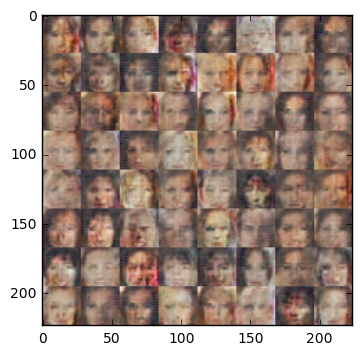

step 3220, (epoch 1/1)... discriminator loss: 4.812... generator loss: 6.401
step 3240, (epoch 1/1)... discriminator loss: 4.773... generator loss: 3.845
step 3260, (epoch 1/1)... discriminator loss: 3.851... generator loss: 0.745
step 3280, (epoch 1/1)... discriminator loss: 4.713... generator loss: 2.527
step 3300, (epoch 1/1)... discriminator loss: 3.215... generator loss: 1.167
step 3320, (epoch 1/1)... discriminator loss: 3.327... generator loss: 3.947
step 3340, (epoch 1/1)... discriminator loss: 4.210... generator loss: 4.775
step 3360, (epoch 1/1)... discriminator loss: 5.474... generator loss: 4.884
step 3380, (epoch 1/1)... discriminator loss: 3.017... generator loss: 0.922
step 3400, (epoch 1/1)... discriminator loss: 5.522... generator loss: 3.608


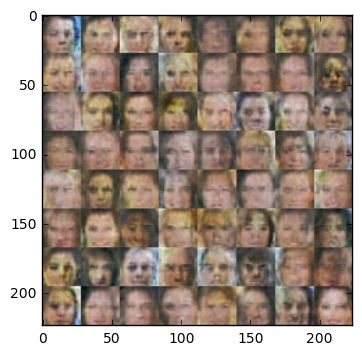

step 3420, (epoch 1/1)... discriminator loss: 3.802... generator loss: 0.514
step 3440, (epoch 1/1)... discriminator loss: 4.900... generator loss: 0.476
step 3460, (epoch 1/1)... discriminator loss: 4.875... generator loss: 5.256
step 3480, (epoch 1/1)... discriminator loss: 4.313... generator loss: 6.817
step 3500, (epoch 1/1)... discriminator loss: 4.017... generator loss: 1.971
step 3520, (epoch 1/1)... discriminator loss: 4.217... generator loss: 5.303
step 3540, (epoch 1/1)... discriminator loss: 3.400... generator loss: 1.116
step 3560, (epoch 1/1)... discriminator loss: 6.373... generator loss: 1.227
step 3580, (epoch 1/1)... discriminator loss: 2.672... generator loss: 1.925
step 3600, (epoch 1/1)... discriminator loss: 2.973... generator loss: 2.645


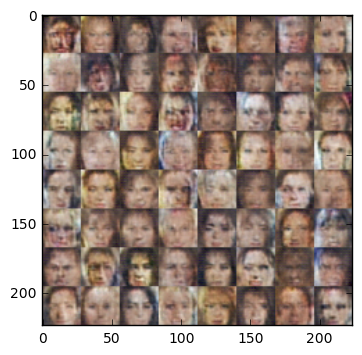

step 3620, (epoch 1/1)... discriminator loss: 3.134... generator loss: 5.211
step 3640, (epoch 1/1)... discriminator loss: 2.816... generator loss: 0.554
step 3660, (epoch 1/1)... discriminator loss: 5.091... generator loss: 1.399
step 3680, (epoch 1/1)... discriminator loss: 9.168... generator loss: 6.487
step 3700, (epoch 1/1)... discriminator loss: 2.163... generator loss: 0.871
step 3720, (epoch 1/1)... discriminator loss: 1.936... generator loss: 1.059
step 3740, (epoch 1/1)... discriminator loss: 4.405... generator loss: 0.924
step 3760, (epoch 1/1)... discriminator loss: 5.078... generator loss: 0.295
step 3780, (epoch 1/1)... discriminator loss: 4.451... generator loss: 2.744
step 3800, (epoch 1/1)... discriminator loss: 4.248... generator loss: 1.743


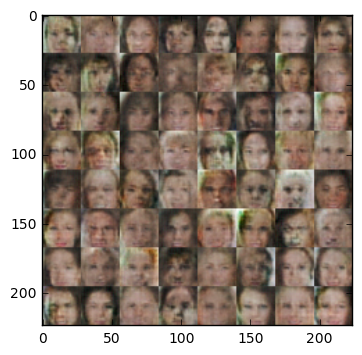

step 3820, (epoch 1/1)... discriminator loss: 2.919... generator loss: 4.664
step 3840, (epoch 1/1)... discriminator loss: 4.615... generator loss: 4.454
step 3860, (epoch 1/1)... discriminator loss: 4.085... generator loss: 5.999
step 3880, (epoch 1/1)... discriminator loss: 4.410... generator loss: 1.943
step 3900, (epoch 1/1)... discriminator loss: 7.152... generator loss: 9.518
step 3920, (epoch 1/1)... discriminator loss: 3.331... generator loss: 1.749
step 3940, (epoch 1/1)... discriminator loss: 3.284... generator loss: 1.044
step 3960, (epoch 1/1)... discriminator loss: 3.776... generator loss: 0.391
step 3980, (epoch 1/1)... discriminator loss: 2.885... generator loss: 1.688
step 4000, (epoch 1/1)... discriminator loss: 3.637... generator loss: 4.179


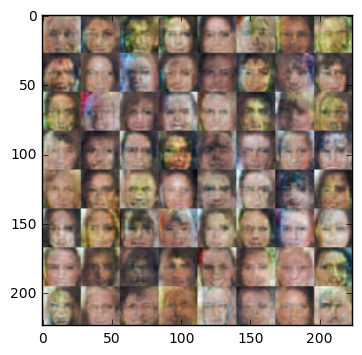

step 4020, (epoch 1/1)... discriminator loss: 4.522... generator loss: 2.004
step 4040, (epoch 1/1)... discriminator loss: 5.320... generator loss: 3.634
step 4060, (epoch 1/1)... discriminator loss: 3.947... generator loss: 1.382
step 4080, (epoch 1/1)... discriminator loss: 4.501... generator loss: 2.409
step 4100, (epoch 1/1)... discriminator loss: 5.006... generator loss: 7.448
step 4120, (epoch 1/1)... discriminator loss: 7.000... generator loss: 4.823
step 4140, (epoch 1/1)... discriminator loss: 4.026... generator loss: 1.333
step 4160, (epoch 1/1)... discriminator loss: 3.978... generator loss: 6.271
step 4180, (epoch 1/1)... discriminator loss: 4.719... generator loss: 2.540
step 4200, (epoch 1/1)... discriminator loss: 2.760... generator loss: 2.329


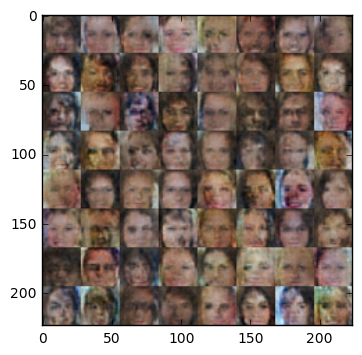

step 4220, (epoch 1/1)... discriminator loss: 2.616... generator loss: 4.824
step 4240, (epoch 1/1)... discriminator loss: 4.374... generator loss: 1.098
step 4260, (epoch 1/1)... discriminator loss: 6.909... generator loss: 2.639
step 4280, (epoch 1/1)... discriminator loss: 4.235... generator loss: 0.680
step 4300, (epoch 1/1)... discriminator loss: 3.594... generator loss: 4.160
step 4320, (epoch 1/1)... discriminator loss: 5.196... generator loss: 5.412
step 4340, (epoch 1/1)... discriminator loss: 3.558... generator loss: 3.631
step 4360, (epoch 1/1)... discriminator loss: 5.116... generator loss: 0.943
step 4380, (epoch 1/1)... discriminator loss: 3.789... generator loss: 4.249
step 4400, (epoch 1/1)... discriminator loss: 2.481... generator loss: 2.813


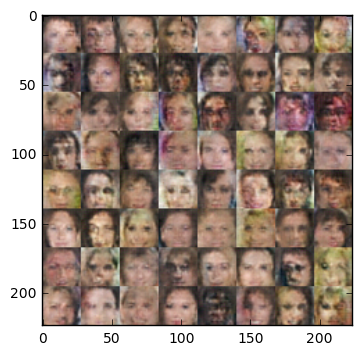

step 4420, (epoch 1/1)... discriminator loss: 2.143... generator loss: 3.965
step 4440, (epoch 1/1)... discriminator loss: 4.417... generator loss: 3.588
step 4460, (epoch 1/1)... discriminator loss: 4.032... generator loss: 0.510
step 4480, (epoch 1/1)... discriminator loss: 2.145... generator loss: 2.644
step 4500, (epoch 1/1)... discriminator loss: 6.299... generator loss: 1.872
step 4520, (epoch 1/1)... discriminator loss: 2.837... generator loss: 1.983
step 4540, (epoch 1/1)... discriminator loss: 3.862... generator loss: 3.376
step 4560, (epoch 1/1)... discriminator loss: 3.111... generator loss: 3.132
step 4580, (epoch 1/1)... discriminator loss: 3.425... generator loss: 1.436
step 4600, (epoch 1/1)... discriminator loss: 3.230... generator loss: 0.597


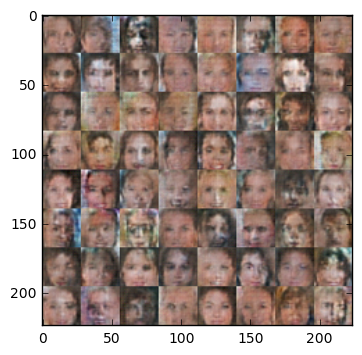

step 4620, (epoch 1/1)... discriminator loss: 3.712... generator loss: 0.734
step 4640, (epoch 1/1)... discriminator loss: 2.974... generator loss: 2.112
step 4660, (epoch 1/1)... discriminator loss: 4.334... generator loss: 2.238
step 4680, (epoch 1/1)... discriminator loss: 4.098... generator loss: 6.739
step 4700, (epoch 1/1)... discriminator loss: 4.085... generator loss: 3.525
step 4720, (epoch 1/1)... discriminator loss: 8.325... generator loss: 3.608
step 4740, (epoch 1/1)... discriminator loss: 2.881... generator loss: 2.830
step 4760, (epoch 1/1)... discriminator loss: 3.635... generator loss: 2.761
step 4780, (epoch 1/1)... discriminator loss: 4.043... generator loss: 1.358
step 4800, (epoch 1/1)... discriminator loss: 3.416... generator loss: 1.791


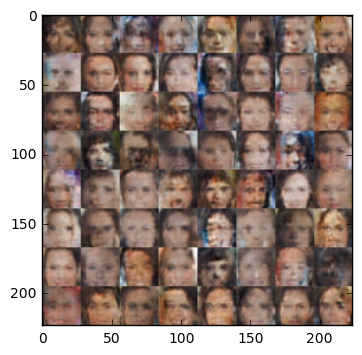

step 4820, (epoch 1/1)... discriminator loss: 4.360... generator loss: 1.755
step 4840, (epoch 1/1)... discriminator loss: 2.991... generator loss: 1.433
step 4860, (epoch 1/1)... discriminator loss: 4.198... generator loss: 2.043
step 4880, (epoch 1/1)... discriminator loss: 3.646... generator loss: 1.225
step 4900, (epoch 1/1)... discriminator loss: 3.299... generator loss: 1.821
step 4920, (epoch 1/1)... discriminator loss: 3.191... generator loss: 3.630
step 4940, (epoch 1/1)... discriminator loss: 3.574... generator loss: 1.804
step 4960, (epoch 1/1)... discriminator loss: 3.544... generator loss: 2.573
step 4980, (epoch 1/1)... discriminator loss: 3.859... generator loss: 2.363
step 5000, (epoch 1/1)... discriminator loss: 3.438... generator loss: 0.925


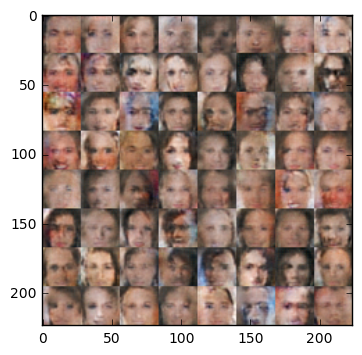

step 5020, (epoch 1/1)... discriminator loss: 3.930... generator loss: 2.049
step 5040, (epoch 1/1)... discriminator loss: 2.912... generator loss: 2.120
step 5060, (epoch 1/1)... discriminator loss: 2.810... generator loss: 1.613
step 5080, (epoch 1/1)... discriminator loss: 4.617... generator loss: 1.911
step 5100, (epoch 1/1)... discriminator loss: 6.284... generator loss: 4.240
step 5120, (epoch 1/1)... discriminator loss: 3.174... generator loss: 0.705
step 5140, (epoch 1/1)... discriminator loss: 3.189... generator loss: 0.724
step 5160, (epoch 1/1)... discriminator loss: 4.601... generator loss: 0.767
step 5180, (epoch 1/1)... discriminator loss: 3.118... generator loss: 1.813
step 5200, (epoch 1/1)... discriminator loss: 4.278... generator loss: 2.560


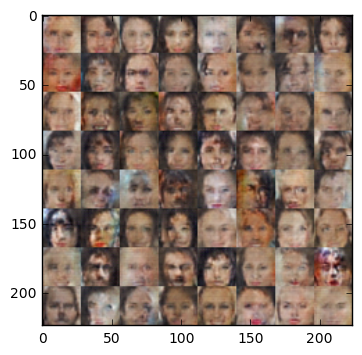

step 5220, (epoch 1/1)... discriminator loss: 3.430... generator loss: 3.711
step 5240, (epoch 1/1)... discriminator loss: 3.314... generator loss: 2.430
step 5260, (epoch 1/1)... discriminator loss: 5.230... generator loss: 3.448
step 5280, (epoch 1/1)... discriminator loss: 3.578... generator loss: 1.094
step 5300, (epoch 1/1)... discriminator loss: 3.313... generator loss: 3.855
step 5320, (epoch 1/1)... discriminator loss: 4.324... generator loss: 0.998
step 5340, (epoch 1/1)... discriminator loss: 4.376... generator loss: 1.371
step 5360, (epoch 1/1)... discriminator loss: 2.331... generator loss: 1.554
step 5380, (epoch 1/1)... discriminator loss: 3.850... generator loss: 0.953
step 5400, (epoch 1/1)... discriminator loss: 2.390... generator loss: 3.320


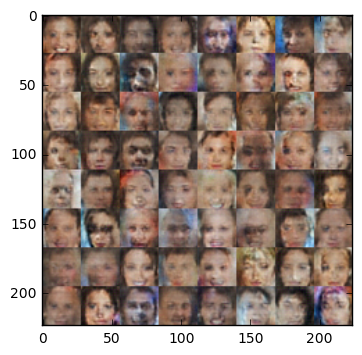

step 5420, (epoch 1/1)... discriminator loss: 3.177... generator loss: 2.282
step 5440, (epoch 1/1)... discriminator loss: 3.209... generator loss: 3.129
step 5460, (epoch 1/1)... discriminator loss: 2.937... generator loss: 4.210
step 5480, (epoch 1/1)... discriminator loss: 3.460... generator loss: 0.774
step 5500, (epoch 1/1)... discriminator loss: 4.772... generator loss: 0.558
step 5520, (epoch 1/1)... discriminator loss: 6.864... generator loss: 4.801
step 5540, (epoch 1/1)... discriminator loss: 3.578... generator loss: 1.577
step 5560, (epoch 1/1)... discriminator loss: 3.427... generator loss: 3.580
step 5580, (epoch 1/1)... discriminator loss: 4.282... generator loss: 0.586
step 5600, (epoch 1/1)... discriminator loss: 4.039... generator loss: 1.331


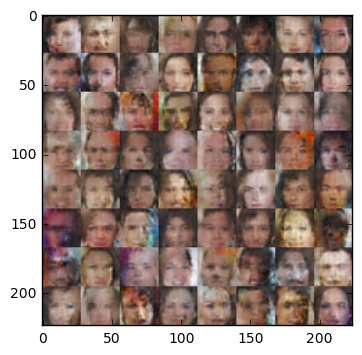

step 5620, (epoch 1/1)... discriminator loss: 2.604... generator loss: 4.605
step 5640, (epoch 1/1)... discriminator loss: 2.638... generator loss: 0.546
step 5660, (epoch 1/1)... discriminator loss: 4.092... generator loss: 0.657
step 5680, (epoch 1/1)... discriminator loss: 3.487... generator loss: 1.144
step 5700, (epoch 1/1)... discriminator loss: 3.616... generator loss: 5.235
step 5720, (epoch 1/1)... discriminator loss: 3.328... generator loss: 3.969
step 5740, (epoch 1/1)... discriminator loss: 4.663... generator loss: 0.658
step 5760, (epoch 1/1)... discriminator loss: 2.800... generator loss: 2.190
step 5780, (epoch 1/1)... discriminator loss: 4.722... generator loss: 2.962
step 5800, (epoch 1/1)... discriminator loss: 3.471... generator loss: 0.773


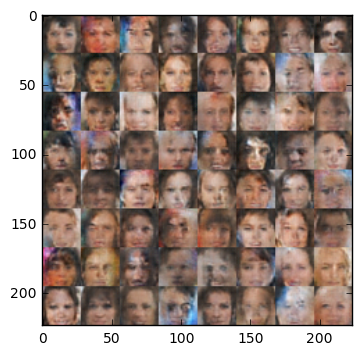

step 5820, (epoch 1/1)... discriminator loss: 3.604... generator loss: 3.346
step 5840, (epoch 1/1)... discriminator loss: 3.258... generator loss: 2.168
step 5860, (epoch 1/1)... discriminator loss: 2.969... generator loss: 0.467
step 5880, (epoch 1/1)... discriminator loss: 3.769... generator loss: 1.746
step 5900, (epoch 1/1)... discriminator loss: 2.932... generator loss: 0.423
step 5920, (epoch 1/1)... discriminator loss: 2.751... generator loss: 2.545
step 5940, (epoch 1/1)... discriminator loss: 2.614... generator loss: 2.513
step 5960, (epoch 1/1)... discriminator loss: 3.002... generator loss: 0.822
step 5980, (epoch 1/1)... discriminator loss: 3.409... generator loss: 3.100
step 6000, (epoch 1/1)... discriminator loss: 2.199... generator loss: 2.902


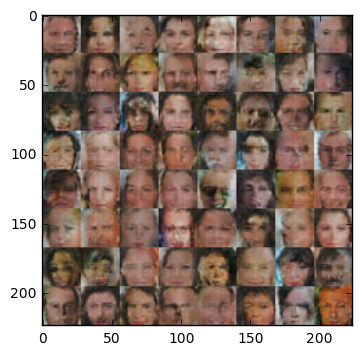

step 6020, (epoch 1/1)... discriminator loss: 3.864... generator loss: 0.898
step 6040, (epoch 1/1)... discriminator loss: 4.441... generator loss: 5.522
step 6060, (epoch 1/1)... discriminator loss: 3.518... generator loss: 1.055
step 6080, (epoch 1/1)... discriminator loss: 2.536... generator loss: 0.920
step 6100, (epoch 1/1)... discriminator loss: 3.066... generator loss: 1.128
step 6120, (epoch 1/1)... discriminator loss: 3.264... generator loss: 1.463
step 6140, (epoch 1/1)... discriminator loss: 3.194... generator loss: 3.241
step 6160, (epoch 1/1)... discriminator loss: 1.840... generator loss: 2.996
step 6180, (epoch 1/1)... discriminator loss: 4.165... generator loss: 2.181
step 6200, (epoch 1/1)... discriminator loss: 3.270... generator loss: 0.834


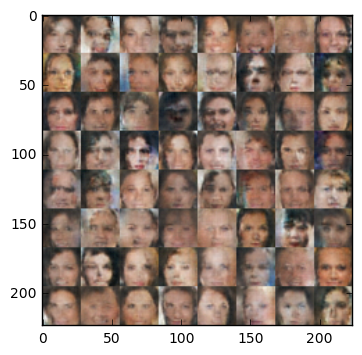

step 6220, (epoch 1/1)... discriminator loss: 3.034... generator loss: 5.443
step 6240, (epoch 1/1)... discriminator loss: 2.097... generator loss: 2.358
step 6260, (epoch 1/1)... discriminator loss: 2.995... generator loss: 2.101
step 6280, (epoch 1/1)... discriminator loss: 3.360... generator loss: 0.641
step 6300, (epoch 1/1)... discriminator loss: 3.044... generator loss: 4.082
step 6320, (epoch 1/1)... discriminator loss: 5.298... generator loss: 3.489


In [15]:
batch_size = 32
z_dim = 100
learning_rate = 0.0006
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.